## **Download Data**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/UDEMY

/content/drive/MyDrive/UDEMY


## **Import Libraries**

In [ ]:
!pip install earthpy

In [5]:
import matplotlib.pyplot as plt

import numpy as np
import earthpy.plot as ep
import seaborn as sns
import earthpy.spatial as es

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd

from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,
                             confusion_matrix, classification_report)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Conv1D, MaxPooling1D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from tqdm import tqdm
from numpy.random import seed
from time import time

seed(11)

# **Load Data**

In [6]:
##################### X data (1096, 715, 102) Hyperspectral satellite (1096*715, 102)
data = loadmat('Pavia.mat')['pavia']

##################### Y data (labels)
gt = loadmat('Pavia_gt.mat')['pavia_gt']

print(f'Data Shape: {data.shape[:-1]}\nNumber of Bands {data.shape[-1]}')

Data Shape: (1096, 715)
Number of Bands 102


In [7]:
df = pd.DataFrame(data.reshape(data.shape[0]*data.shape[1], -1))

df.columns = [f'band{i}' for i in range(1, df.shape[-1]+1)]

df['class'] = gt.ravel()

In [8]:
df.head()


,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band94,band95,band96,band97,band98,band99,band100,band101,band102,class
0,854,601,350,266,138,118,178,194,257,269,...,3759,3773,3779,3752,3690,3671,3664,3636,3643,0
1,527,642,575,294,123,168,207,154,209,299,...,3873,3902,3921,3861,3854,3882,3834,3725,3768,0
2,374,322,179,87,169,268,360,339,286,309,...,4443,4472,4428,4353,4306,4284,4318,4311,4321,0
3,706,520,560,572,425,243,271,272,258,276,...,3972,4006,4032,3975,3946,3954,3944,3936,3939,0
4,1120,1027,592,414,407,463,417,365,332,334,...,4502,4485,4479,4445,4364,4290,4268,4235,4272,0


In [9]:

print(1096*715), df.shape


783640


(None, (783640, 103))

# **Data Visualization**

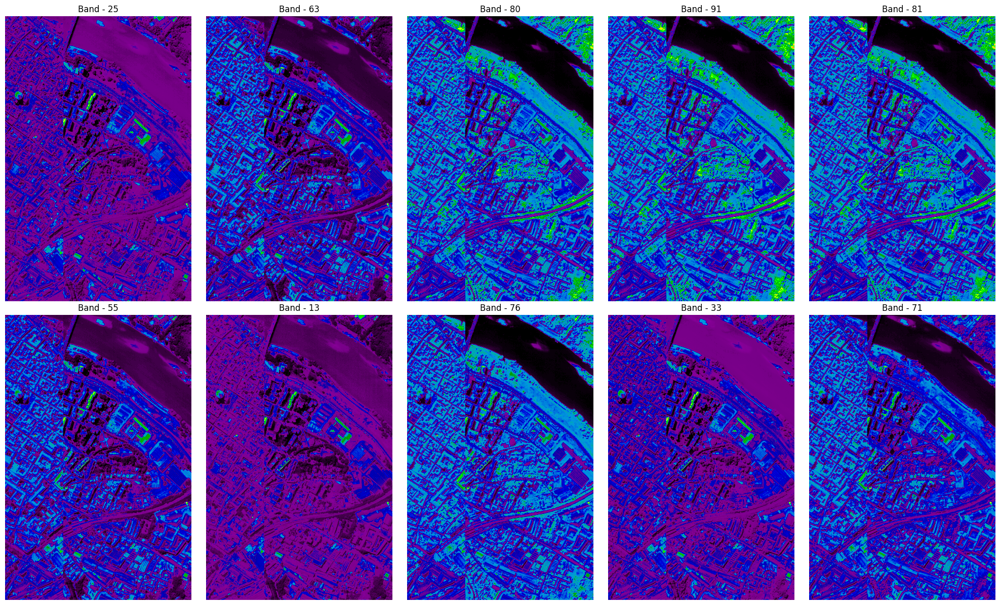

In [10]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()

# **RGB Composite Image**

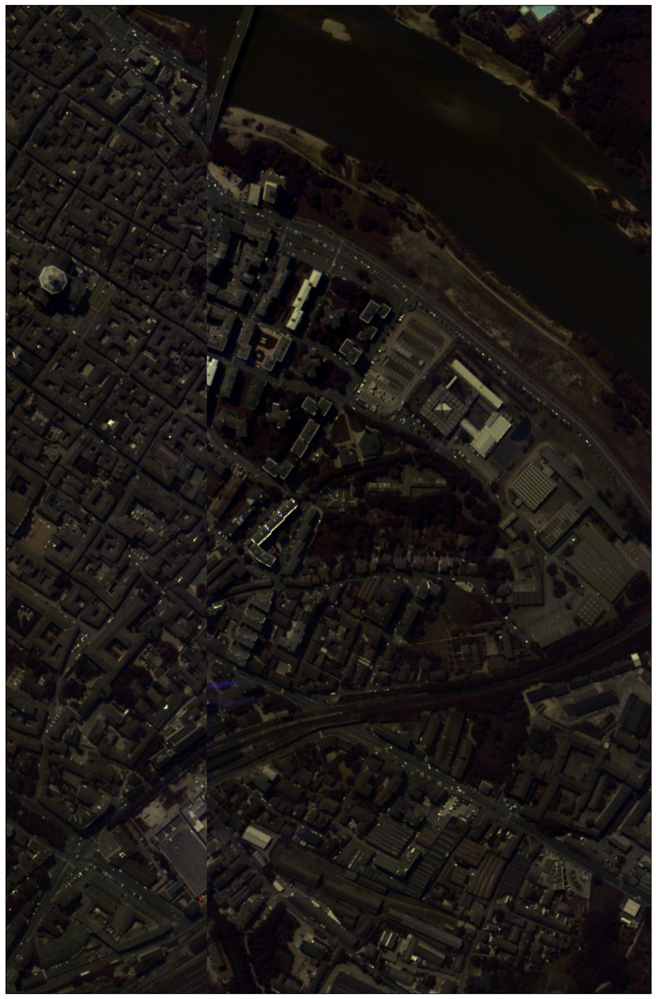

<function matplotlib.pyplot.show(close=None, block=None)>

In [11]:
mdata = np.moveaxis(data, -1, 0)

ep.plot_rgb(mdata, (29, 19, 2), figsize=(15, 25))

plt.show

# **GroundTruth Visualizaation**

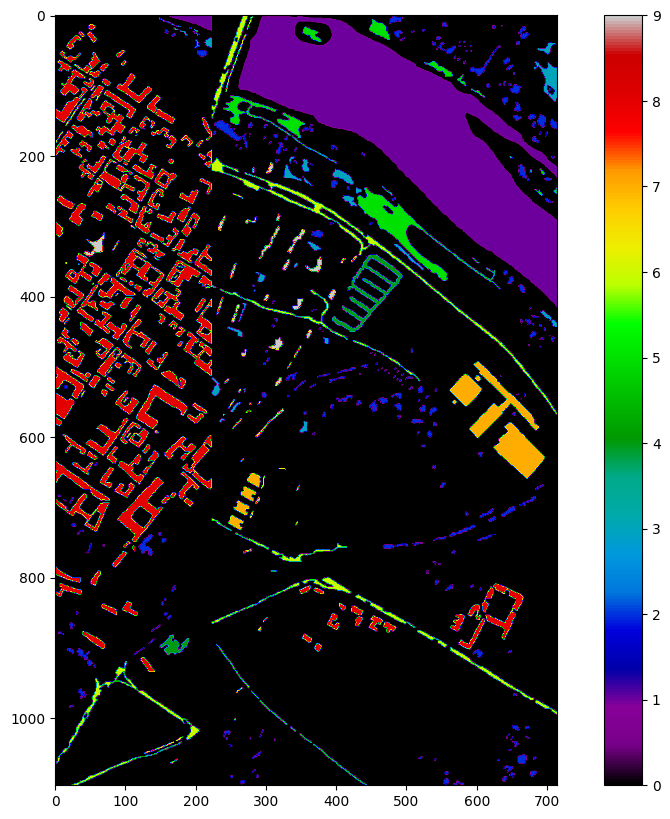

In [12]:
def plot_data(data):
  fig = plt.figure(figsize=(12, 10))
  plt.imshow(data, cmap='nipy_spectral')
  plt.colorbar()
  plt.axis('on')
  plt.show()

plot_data(gt)

# **Scaling Data**

In [13]:
t_df = df[df['class']!=0]

ind = ['band'+str(i) for i in range(1, t_df.shape[-1])]

X = t_df.loc[:, ind]
X_scaled=X.to_numpy()
y = to_categorical(t_df.loc[:, 'class'])

##### X_normalized= (X - np.min(X))/(np.max(X)- np.min(X))  [0 1]

X_scaled = minmax_scale(X,feature_range=(0, 1), axis = 0);
#X_scaled=(X_scaled+11)/(9300)
X_scaled.shape, y.shape

((148152, 102), (148152, 10))

In [14]:
np.min(X_scaled), np.max(X_scaled)

(0.0, 1.0)

In [15]:
X_scaled.shape

(148152, 102)

In [16]:
np.min(X_scaled), np.max(X_scaled)

(0.0, 1.0)

# **Split Data**

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,
                                                    stratify=y, 
                                                    test_size=0.7)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}") 

X_train: (44445, 102)
y_train: (44445, 10)
X_test: (103707, 102)
y_test: (103707, 10)


In [18]:
X.shape

(148152, 102)

# **Build CNN**

In [19]:
ip_shape = X_train[1].shape

n_outputs = y_train.shape[1]

X_train[1].ravel().shape

(102,)

In [20]:
ip_shape

(102,)

In [21]:
X_train = X_train.reshape(-1, 102, 1)
X_test = X_test.reshape(-1, 102, 1)

In [22]:
X_train.shape, 

((44445, 102, 1),)

In [23]:
model = Sequential(name = 'Salinas_CNN')

model.add(Conv1D(filters = 32, kernel_size = 1, activation ='relu', input_shape =(ip_shape[0],1), name = 'Layer1'))
model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu' , name = 'Layer2'))
model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer1'))
model.add(Dropout(0.4, name = 'Dropout1'))

model.add(Conv1D(filters = 64, kernel_size = 1, activation ='relu', input_shape =(ip_shape[0],1), name = 'Layer3'))
model.add(Conv1D(filters = 128, kernel_size = 3, activation ='relu' , name = 'Layer4'))
model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer2'))
model.add(Dropout(0.4, name = 'Dropout2'))

model.add(Flatten(name = 'Flatten'))

model.add(Dense(200, activation='relu', name = 'DenseLayer1'))
model.add(Dense(50, activation='relu', name = 'DenseLayer2'))

model.add(Dense(n_outputs, activation='softmax', name = 'OutputLayer'))


model.summary()

Model: "Salinas_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv1D)             (None, 102, 32)           64        
                                                                 
 Layer2 (Conv1D)             (None, 100, 64)           6208      
                                                                 
 MaxPooling_Layer1 (MaxPooli  (None, 50, 64)           0         
 ng1D)                                                           
                                                                 
 Dropout1 (Dropout)          (None, 50, 64)            0         
                                                                 
 Layer3 (Conv1D)             (None, 50, 64)            4160      
                                                                 
 Layer4 (Conv1D)             (None, 48, 128)           24704     
                                                       

In [24]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train,
                                                    stratify=y_train, 
                                                    test_size=0.3)

In [25]:
X_train.shape, X_val.shape

((31111, 102, 1), (13334, 102, 1))

In [26]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [27]:
early_stop = EarlyStopping(monitor = 'val_loss',
                            mode = 'min',
                            min_delta = 0,
                            patience = 10,
                            restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Pavia_Model.h5', 
                             monitor = 'val_loss', 
                             mode ='min', 
                             save_best_only = True)

tensorboard = TensorBoard(log_dir='SA_logs/{}'.format(time()))

In [28]:
hist = model.fit(X_train, 
                       y_train, 
                       epochs = 5, 
                       batch_size = 32, 
                       validation_data = (X_val, y_val), 
                       callbacks=[early_stop,
                                  checkpoint,
                                  tensorboard])
 

Epoch 1/5
973/973 [==============================] - 44s 43ms/step - loss: 0.2214 - accuracy: 0.9269 - val_loss: 0.1223 - val_accuracy: 0.9568
Epoch 2/5
973/973 [==============================] - 41s 42ms/step - loss: 0.1055 - accuracy: 0.9610 - val_loss: 0.1149 - val_accuracy: 0.9591
Epoch 3/5
973/973 [==============================] - 37s 38ms/step - loss: 0.0941 - accuracy: 0.9646 - val_loss: 0.1212 - val_accuracy: 0.9548
Epoch 4/5
973/973 [==============================] - 42s 43ms/step - loss: 0.0901 - accuracy: 0.9663 - val_loss: 0.1861 - val_accuracy: 0.9309
Epoch 5/5
973/973 [==============================] - 36s 37ms/step - loss: 0.0877 - accuracy: 0.9671 - val_loss: 0.1441 - val_accuracy: 0.9471


In [29]:
%load_ext tensorboard

%tensorboard --logdir SA_logs/

<IPython.core.display.Javascript object>

In [30]:
hist = pd.DataFrame(data= hist.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))

fig.show()

In [31]:
loss, acc = model.evaluate(X_test, y_test)

3241/3241 [==============================] - 35s 11ms/step - loss: 0.1504 - accuracy: 0.9452


In [32]:
print(f"Accuracy: {acc*100}\nLoss: {loss}")

Accuracy: 94.5162832736969
Loss: 0.1504039466381073


In [33]:
from tensorflow.keras.models import load_model

model = load_model("Pavia_Model.h5")

In [34]:
pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1)))

3241/3241 [==============================] - 26s 8ms/step
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     46288
           2       0.92      0.90      0.91      5408
           3       0.76      0.79      0.77      2095
           4       0.68      0.67      0.68      1913
           5       0.83      0.96      0.89      4012
           6       0.91      0.82      0.86      7202
           7       0.74      0.96      0.84      3934
           8       1.00      0.97      0.98     30811
           9       1.00      0.98      0.99      2044

    accuracy                           0.96    103707
   macro avg       0.87      0.89      0.88    103707
weighted avg       0.96      0.96      0.96    103707



In [36]:
pred.shape

(103707,)

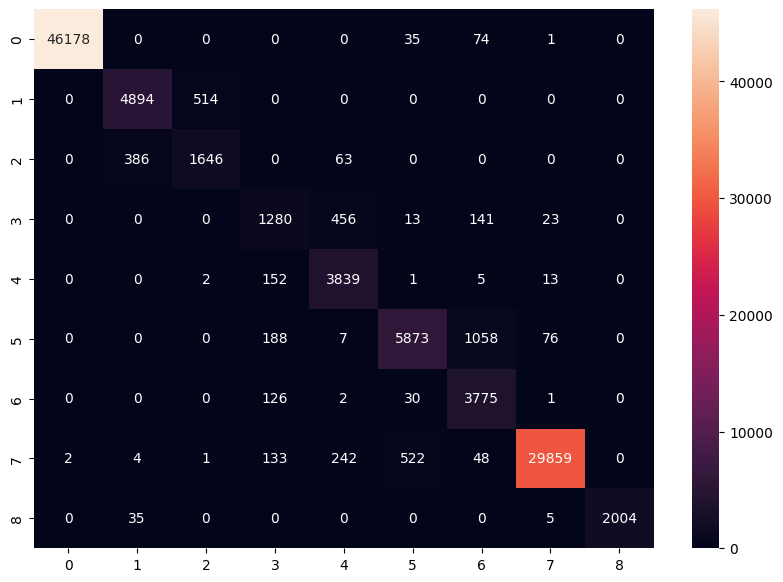

In [37]:
plt.figure(figsize = (10,7))


mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

# **Predicting whole image**

In [38]:
image = pd.DataFrame(data.reshape(data.shape[0]*data.shape[1], -1))
image.columns = [f'band{i}' for i in range(1, image.shape[-1]+1)]
image_scaled = image.to_numpy()
image_scaled=minmax_scale(image_scaled,feature_range=(0, 1), axis = 0)
image_scaled = image_scaled.reshape(-1, 102, 1)

In [39]:
np.min(image_scaled), np.max(image_scaled)

(0.0, 1.0)

In [40]:
prediction = np.argmax(model.predict(image_scaled), axis=1)

24489/24489 [==============================] - 205s 8ms/step


In [41]:
np.min(prediction), np.max(prediction)

(1, 9)

In [42]:
prediction_reshaped = prediction.reshape(1096,715)

In [43]:
gt=prediction_reshaped

In [44]:
gt.shape

(1096, 715)

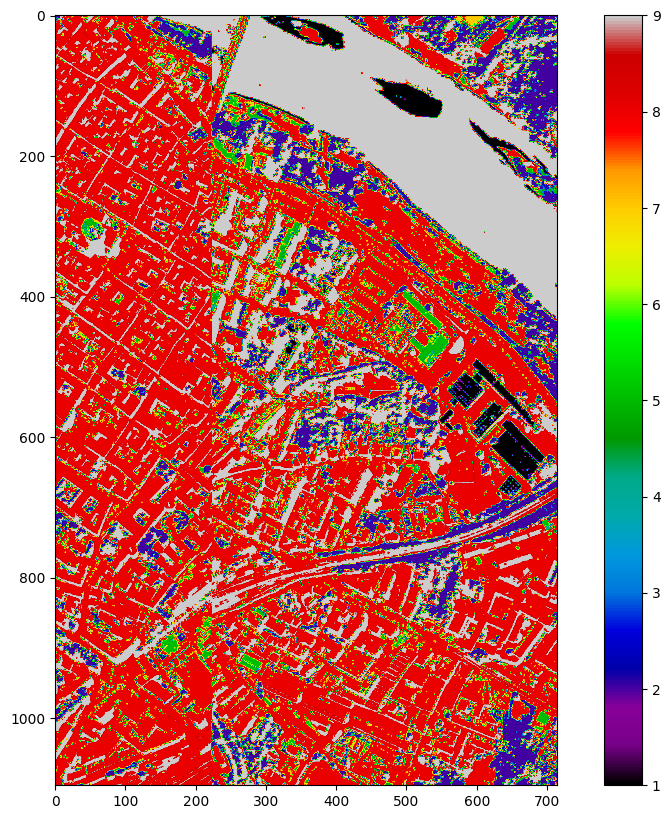

In [45]:
plot_data(prediction_reshaped)